<a href="https://colab.research.google.com/github/anasshamoon12002/data-mining-2023-24/blob/main/Data%20Preparation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd "drive/MyDrive/Colab Notebooks/data-mining-2023-24"

/content/drive/MyDrive/Colab Notebooks/data-mining-2023-24


# Data Preparation

### Preliminary

In [3]:
import numpy as np
import pandas as pd
import seaborn as sn
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import missingno as msno
import plotly.express as px

In [4]:
df_incidents = pd.read_csv('data/df_incidents_data_understanding.csv')

In [5]:
df_incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 175718 entries, 0 to 175717
Data columns (total 39 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   date                       175718 non-null  object 
 1   state                      175718 non-null  object 
 2   city_or_county             175718 non-null  object 
 3   address                    163366 non-null  object 
 4   latitude                   169449 non-null  float64
 5   longitude                  169449 non-null  float64
 6   congressional_district     166248 non-null  float64
 7   state_house_district       146151 non-null  float64
 8   state_senate_district      150909 non-null  float64
 9   participant_age1           128862 non-null  float64
 10  participant_age_group1     135152 non-null  object 
 11  participant_gender1        139646 non-null  object 
 12  min_age_participants       128863 non-null  float64
 13  avg_age_participants       12

## Remove Useless Columns

In [6]:
# Discarding useless columns
useless_columns = [
    'date', 'city_or_county', 'address', 'participant_age1', 'participant_age_group1',
    'participant_gender1', 'notes', 'incident_characteristics1', 'incident_characteristics2',
    'is_valid_state', 'year', 'month', 'day', 'weekday'
]
df_incidents.drop(columns=useless_columns, inplace=True)

# Handle Missing Values in  Incidents Data

## Utils

In [9]:
def replace_from_non_null_distribution(df, column):
  # Extract non-null values from column 'A'
  non_null_values = df[column][df[column].notnull()]
  # Sample values from the distribution of non-null values
  sampled_values = non_null_values.sample(n=df[column].isnull().sum(), replace=True)
  # Replace null values with sampled values
  df.loc[df[column].isnull(), column] = sampled_values.values
  return df

In [10]:
def replace_from_non_null_distribution_with_min_threshold(df, columnA, columnB):
  non_null_values = df[columnA][df[columnA].notnull()]
  sampled_values = non_null_values.sample(n=df[columnA].isnull().sum(), replace=True)
  for (idx, val), value in zip(df.loc[df[columnA].isnull(), columnA].items(), sampled_values):
    min_allowed_A = df.at[idx, columnB]  # Minimum allowed value for columnA in this row
    df.at[idx, columnA] = max(min_allowed_A, value)
  return df

In [11]:
def replace_from_non_null_distribution_with_max_threshold(df, columnA, columnB, *columns):
  non_null_values = df[columnA][df[columnA].notnull()]
  sampled_values = non_null_values.sample(n=df[columnA].isnull().sum(), replace=True)
  for (idx, val), value in zip(df.loc[df[columnA].isnull(), columnA].items(), sampled_values):
    max_allowed_A = df.at[idx, columnB]  # Minimum allowed value for columnA in this row
    for column in columns:
      max_allowed_A -= df.at[idx, column]
    df.at[idx, columnA] = min(value, max(max_allowed_A, 0))
  return df

In [7]:
# Discard the records with nulls in location information
location_columns = ['latitude', 'longitude', 'congressional_district', 'state_house_district', 'state_senate_district']
df_incidents = df_incidents.dropna(subset=location_columns)

In [8]:
df_incidents.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 145246 entries, 0 to 175717
Data columns (total 25 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   state                   145246 non-null  object 
 1   latitude                145246 non-null  float64
 2   longitude               145246 non-null  float64
 3   congressional_district  145246 non-null  float64
 4   state_house_district    145246 non-null  float64
 5   state_senate_district   145246 non-null  float64
 6   min_age_participants    107075 non-null  float64
 7   avg_age_participants    107074 non-null  float64
 8   max_age_participants    107074 non-null  float64
 9   n_participants_child    112175 non-null  float64
 10  n_participants_teen     112175 non-null  float64
 11  n_participants_adult    112175 non-null  float64
 12  n_males                 116198 non-null  float64
 13  n_females               116198 non-null  float64
 14  n_killed            

<Axes: ylabel='Frequency'>

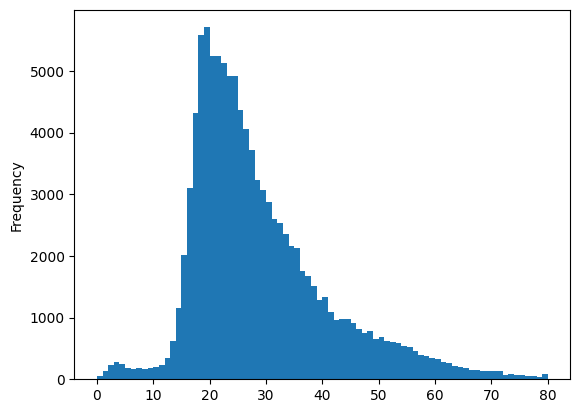

In [12]:
%matplotlib inline
df_incidents['min_age_participants'].plot(kind='hist', bins=80)

In [13]:
df_incidents = replace_from_non_null_distribution(df_incidents, 'min_age_participants')

<Axes: ylabel='Frequency'>

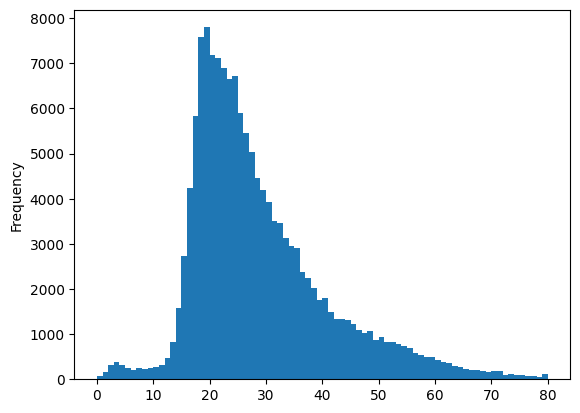

In [14]:
%matplotlib inline
df_incidents['min_age_participants'].plot(kind='hist', bins=80)

In [15]:
df_incidents['min_age_participants'].isnull().sum()

0

In [16]:
df_incidents = replace_from_non_null_distribution_with_min_threshold(df_incidents, 'avg_age_participants', 'min_age_participants')

In [17]:
df_incidents['avg_age_participants'].isnull().sum()

0

In [18]:
condition = df_incidents['min_age_participants'] > df_incidents['avg_age_participants']
len(df_incidents[condition])

0

In [19]:
df_incidents = replace_from_non_null_distribution_with_min_threshold(df_incidents, 'max_age_participants', 'avg_age_participants')

In [20]:
condition = df_incidents['avg_age_participants'] > df_incidents['max_age_participants']
len(df_incidents[condition])

0

In [21]:
# Print the columns with nulls and their count and percentage
missing_values = df_incidents.isnull().sum()
print(f"Missing values:\n{missing_values}")

Missing values:
state                         0
latitude                      0
longitude                     0
congressional_district        0
state_house_district          0
state_senate_district         0
min_age_participants          0
avg_age_participants          0
max_age_participants          0
n_participants_child      33071
n_participants_teen       33071
n_participants_adult      33071
n_males                   29048
n_females                 29048
n_killed                      0
n_injured                     0
n_arrested                22053
n_unharmed                22053
n_participants                0
datetime                      0
males_ratio               29048
females_ratio             29048
shot                          0
wounded                       0
dead                          0
dtype: int64


In [23]:
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_participants_child', 'n_participants')

In [24]:
condition = df_incidents['n_participants_child'] > df_incidents['n_participants']
len(df_incidents[condition])

0

In [25]:
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_participants_teen', 'n_participants', 'n_participants_child')

In [26]:
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_participants_adult', 'n_participants', 'n_participants_child', 'n_participants_teen')

In [27]:
condition = df_incidents['n_participants_teen'] + df_incidents['n_participants_child'] + df_incidents['n_participants_adult'] > df_incidents['n_participants']
len(df_incidents[condition])

0

In [28]:
# Print the columns with nulls and their count and percentage
missing_values = df_incidents.isnull().sum()
print(f"Missing values:\n{missing_values}")

Missing values:
state                         0
latitude                      0
longitude                     0
congressional_district        0
state_house_district          0
state_senate_district         0
min_age_participants          0
avg_age_participants          0
max_age_participants          0
n_participants_child          0
n_participants_teen           0
n_participants_adult          0
n_males                   29048
n_females                 29048
n_killed                      0
n_injured                     0
n_arrested                22053
n_unharmed                22053
n_participants                0
datetime                      0
males_ratio               29048
females_ratio             29048
shot                          0
wounded                       0
dead                          0
dtype: int64


In [29]:
df_incidents_backup = df_incidents.copy()

In [30]:
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_males', 'n_participants')

In [31]:
condition = df_incidents['n_females'].isnull() | (df_incidents['n_males'] + df_incidents['n_females'] == df_incidents['n_participants'])
len(df_incidents[~condition])

0

In [32]:
df_incidents['n_females'] = df_incidents['n_participants'] - df_incidents['n_males']

In [33]:
len(df_incidents[df_incidents['n_participants'] == 0])

19847

In [34]:
df_incidents = df_incidents[df_incidents['n_participants'] > 0]

In [35]:
len(df_incidents)

125399

In [36]:
df_incidents['males_ratio'] = df_incidents['n_males'] / df_incidents['n_participants']
df_incidents['females_ratio'] = df_incidents['n_females'] / df_incidents['n_participants']

In [37]:
df_incidents.isnull().sum()

state                        0
latitude                     0
longitude                    0
congressional_district       0
state_house_district         0
state_senate_district        0
min_age_participants         0
avg_age_participants         0
max_age_participants         0
n_participants_child         0
n_participants_teen          0
n_participants_adult         0
n_males                      0
n_females                    0
n_killed                     0
n_injured                    0
n_arrested                2206
n_unharmed                2206
n_participants               0
datetime                     0
males_ratio                  0
females_ratio                0
shot                         0
wounded                      0
dead                         0
dtype: int64

In [38]:
condition = df_incidents['n_unharmed'].isnull() | (df_incidents['n_injured'] + df_incidents['n_unharmed'] <= df_incidents['n_participants'])
len(df_incidents[~condition])

14

In [39]:
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_arrested', 'n_participants')
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_unharmed', 'n_participants', 'n_injured')

In [40]:
condition = df_incidents['n_injured'] + df_incidents['n_unharmed'] <= df_incidents['n_participants']
len(df_incidents[~condition])

14

In [41]:
df_incidents = df_incidents[condition]
len(df_incidents)

125385

In [43]:
#Cast congressional_district, state_house_district, state_senate_district to int
df_incidents['congressional_district'] = df_incidents['congressional_district'].astype(int)
df_incidents['state_house_district'] = df_incidents['state_house_district'].astype(int)
df_incidents['state_senate_district'] = df_incidents['state_senate_district'].astype(int)

In [44]:
#Create a composite key for state and congressional_district. Use lowercase for state
df_incidents['state_congressional_district'] = df_incidents['state'].str.lower() + '_' + df_incidents['congressional_district'].astype(str)
#remove spaces
df_incidents['state_congressional_district'] = df_incidents['state_congressional_district'].str.replace(' ', '')

#Print the first few rows of the dataframe
df_incidents.head()

,state,latitude,longitude,congressional_district,state_house_district,state_senate_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,...,n_arrested,n_unharmed,n_participants,datetime,males_ratio,females_ratio,shot,wounded,dead,state_congressional_district
0,Indiana,39.8322,-86.2492,7,94,33,19.0,19.0,19.0,0.0,...,0.0,0.0,1.0,2015-05-02,1.0,0.0,1,1,0,indiana_7
2,Michigan,42.4190,-83.0393,14,4,2,25.0,32.0,32.0,0.0,...,0.0,1.0,2.0,2016-11-05,0.5,0.5,1,1,0,michigan_14
3,North Carolina,35.1847,-77.9527,13,4,7,65.0,65.0,65.0,0.0,...,0.0,0.0,1.0,2014-01-18,1.0,0.0,1,1,0,northcarolina_13
4,Louisiana,30.6069,-91.2270,6,63,15,20.0,26.0,30.0,0.0,...,2.0,0.0,5.0,2018-01-25,1.0,0.0,1,1,0,louisiana_6
5,Virginia,38.3008,-77.4469,1,28,28,65.0,65.0,65.0,0.0,...,0.0,0.0,1.0,2016-08-01,1.0,0.0,1,0,1,virginia_1


In [45]:
df_incidents.to_csv('data/df_incidents_data_preparation_state_congressional_ids.csv', index=False)

# Ingest The Poverty Dataset and Handle it

In [46]:
df_poverty = pd.read_csv('data/povertyByStateYear.csv')

In [47]:
df_poverty.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884 entries, 0 to 883
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   state              884 non-null    object 
 1   year               884 non-null    int64  
 2   povertyPercentage  832 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 20.8+ KB


From the information about the dataframe, we can observe
 - That there are only null values in the povertypercentage
 - We will need to work on that.
 - We also need tot check that the other values in state and year are valid


In [48]:
df_poverty.describe()

,year,povertyPercentage
count,884.000000,832.000000
mean,2011.998869,12.535817
std,4.902330,3.205233
min,2004.000000,5.400000
25%,2008.000000,10.200000
50%,2012.000000,12.000000
75%,2016.000000,14.700000
max,2020.000000,21.800000


In [50]:
#check for missing values
df_poverty.isnull().sum()

state                 0
year                  0
povertyPercentage    52
dtype: int64

<Axes: >

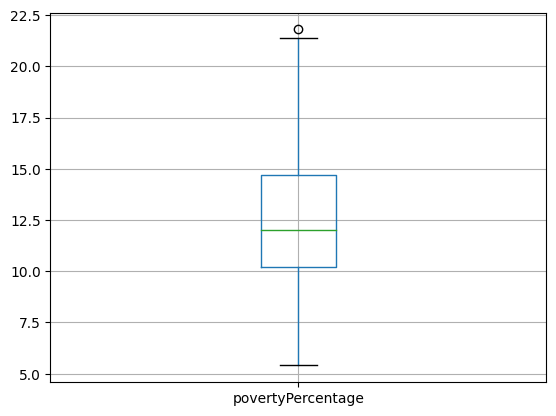

In [51]:
#check for outliers on the poverty rate
df_poverty.boxplot(column=['povertyPercentage'])

In [52]:
#check for invalid state names
print(df_poverty['state'].unique())

#Count number of rows with invalid state names
df_poverty.loc[~df_poverty['state'].isin([
    'Alabama','Alaska','Arizona','Arkansas','California','Colorado','Connecticut','Delaware','Florida','Georgia','Hawaii',
    'Idaho','Illinois','Indiana','Iowa','Kansas','Kentucky','Louisiana','Maine','Maryland','Massachusetts','Michigan',
    'Minnesota','Mississippi','Missouri','Montana','Nebraska','Nevada','New Hampshire','New Jersey','New Mexico',
                                            'New York','North Carolina','North Dakota','Ohio','Oklahoma','Oregon','Pennsylvania','Rhode Island','South Carolina',
                                            'South Dakota','Tennessee','Texas','Utah','Vermont','Virginia','Washington','West Virginia','Wisconsin','Wyoming'
                                            ,'District of Columbia'])].count()

['United States' 'Alabama' 'Alaska' 'Arizona' 'Arkansas' 'California'
 'Colorado' 'Connecticut' 'Delaware' 'District of Columbia' 'Florida'
 'Georgia' 'Hawaii' 'Idaho' 'Illinois' 'Indiana' 'Iowa' 'Kansas'
 'Kentucky' 'Louisiana' 'Maine' 'Maryland' 'Massachusetts' 'Michigan'
 'Minnesota' 'Mississippi' 'Missouri' 'Montana' 'Nebraska' 'Nevada'
 'New Hampshire' 'New Jersey' 'New Mexico' 'New York' 'North Carolina'
 'North Dakota' 'Ohio' 'Oklahoma' 'Oregon' 'Pennsylvania' 'Rhode Island'
 'South Carolina' 'South Dakota' 'Tennessee' 'Texas' 'Utah' 'Vermont'
 'Virginia' 'Washington' 'West Virginia' 'Wisconsin' 'Wyoming']


state                17
year                 17
povertyPercentage    16
dtype: int64

In [53]:
#Drop rows with invalid state names
df_poverty = df_poverty.loc[df_poverty['state'].isin(['Alabama','Alaska','Arizona','Arkansas','California','Colorado','Connecticut','Delaware','Florida','Georgia','Hawaii',
                                            'Idaho','Illinois','Indiana','Iowa','Kansas','Kentucky','Louisiana','Maine','Maryland','Massachusetts','Michigan',
                                            'Minnesota','Mississippi','Missouri','Montana','Nebraska','Nevada','New Hampshire','New Jersey','New Mexico',
                                            'New York','North Carolina','North Dakota','Ohio','Oklahoma','Oregon','Pennsylvania','Rhode Island','South Carolina',
                                            'South Dakota','Tennessee','Texas','Utah','Vermont','Virginia','Washington','West Virginia','Wisconsin','Wyoming'
                                            ,'District of Columbia'])]

In [54]:
len(df_poverty)

867

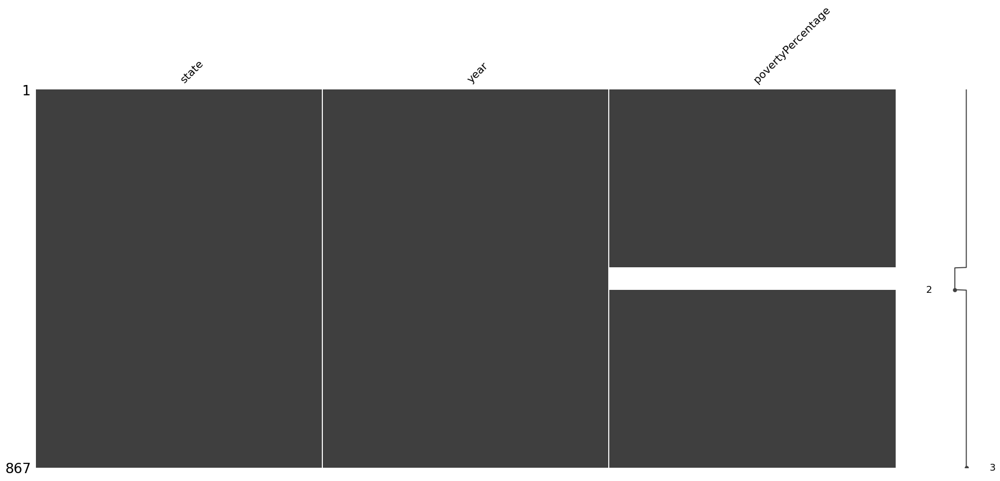

<Figure size 300x200 with 0 Axes>

In [58]:
#Use the nullity matrix to get a quick visual summary of the data completeness
msno.matrix(df_poverty)
plt.figure(figsize =(3,2))
plt.show()

In [63]:
#Check for columns with mixed data types
df_poverty.dtypes

state                 object
year                   int64
povertyPercentage    float64
dtype: object

In [64]:
#check for invalid years
df_poverty['year'].unique()

array([2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010,
       2009, 2008, 2007, 2006, 2005, 2004])

In [68]:
df_poverty[df_poverty['year'] == 2012].notna().sum()

state                51
year                 51
povertyPercentage     0
dtype: int64

As we can see, all records with 'year' == 2012 are nulls. We're gonna now replace these nulls with the average of the corresponding values for the years 2011 and 2013.

In [69]:
states = df_poverty['state'].unique()
states

array(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California',
       'Colorado', 'Connecticut', 'Delaware', 'District of Columbia',
       'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana',
       'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland',
       'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi',
       'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire',
       'New Jersey', 'New Mexico', 'New York', 'North Carolina',
       'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania',
       'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee',
       'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
       'West Virginia', 'Wisconsin', 'Wyoming'], dtype=object)

In [80]:
df_poverty_bak = df_poverty.copy()

In [83]:
for state in states:
  value = df_poverty.loc[(df_poverty['state'] == state) & ((df_poverty['year'] == 2011) | (df_poverty['year'] == 2013))]['povertyPercentage'].mean()
  df_poverty.loc[(df_poverty['state'] == state) & (df_poverty['year'] == 2012), 'povertyPercentage'] = value

In [84]:
df_poverty.isnull().sum()

state                0
year                 0
povertyPercentage    0
dtype: int64

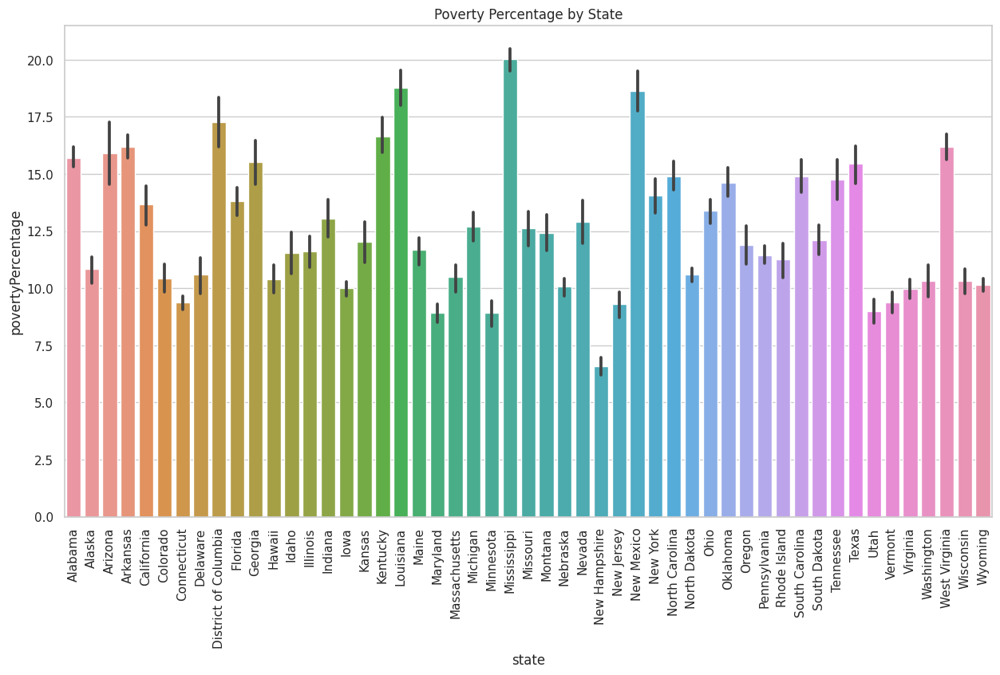

In [85]:
#Visualize the poverty percentage by state
plt.figure(figsize=(15,8))
sn.set(style="whitegrid")
ax = sn.barplot(x="state", y="povertyPercentage", data=df_poverty)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.title('Poverty Percentage by State')
plt.show()

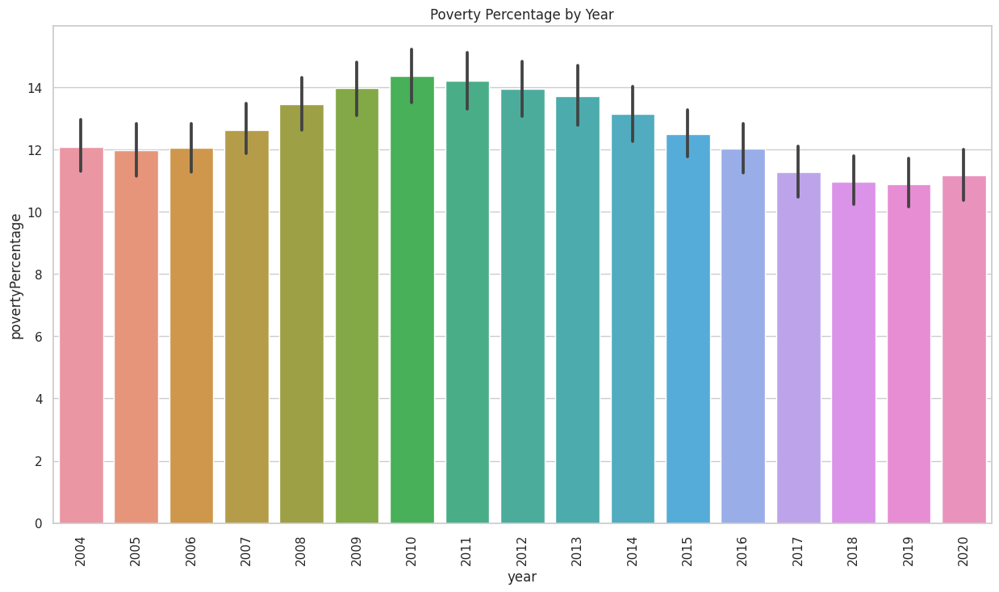

In [86]:
#Visualize the poverty percentage by year
plt.figure(figsize=(15,8))
sn.set(style="whitegrid")
ax = sn.barplot(x="year", y="povertyPercentage", data=df_poverty)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.title('Poverty Percentage by Year')
plt.show()

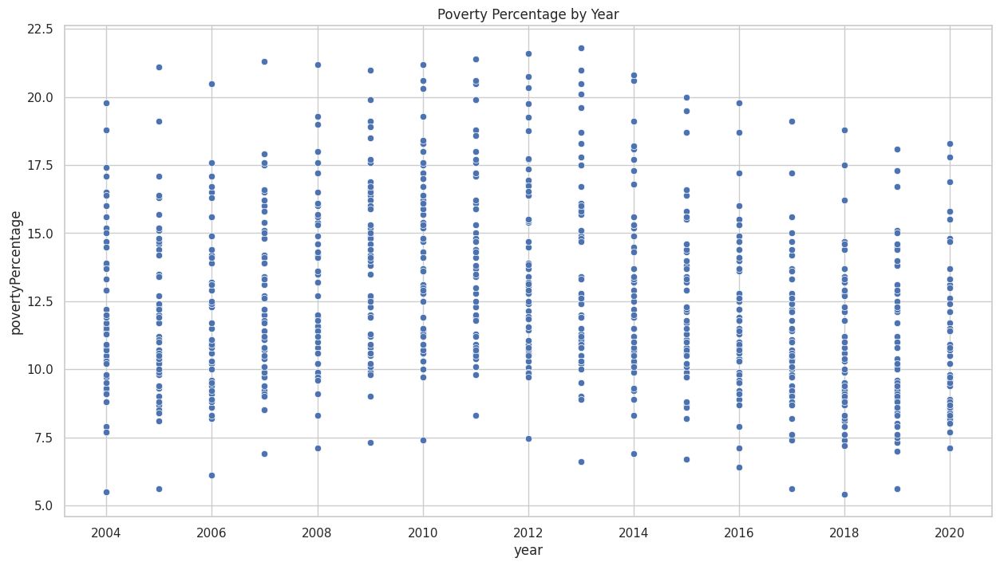

In [88]:
#Visualize any correlations between the poverty percentage and the year
plt.figure(figsize=(15,8))
sn.set(style="whitegrid")
ax = sn.scatterplot(x="year", y="povertyPercentage", data=df_poverty)
plt.title('Poverty Percentage by Year')
plt.show()

In [89]:
summary_stats = df_poverty.describe(include='all')
print("Summary Statistics:\n", summary_stats)

Summary Statistics:
           state         year  povertyPercentage
count       867   867.000000         867.000000
unique       51          NaN                NaN
top     Alabama          NaN                NaN
freq         17          NaN                NaN
mean        NaN  2011.998847          12.610611
std         NaN     4.902396           3.252767
min         NaN  2004.000000           5.400000
25%         NaN  2008.000000          10.200000
50%         NaN  2012.000000          12.000000
75%         NaN  2016.000000          14.800000
max         NaN  2020.000000          21.800000


In [91]:
#Save the cleaned data to a csv file
df_poverty.to_csv('data/df_poverty_data_understanding.csv', index=False)

### Merge Incidents and Poverty Data

In [93]:
df_incidents.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 125385 entries, 0 to 175717
Data columns (total 26 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   state                         125385 non-null  object 
 1   latitude                      125385 non-null  float64
 2   longitude                     125385 non-null  float64
 3   congressional_district        125385 non-null  int64  
 4   state_house_district          125385 non-null  int64  
 5   state_senate_district         125385 non-null  int64  
 6   min_age_participants          125385 non-null  float64
 7   avg_age_participants          125385 non-null  float64
 8   max_age_participants          125385 non-null  float64
 9   n_participants_child          125385 non-null  float64
 10  n_participants_teen           125385 non-null  float64
 11  n_participants_adult          125385 non-null  float64
 12  n_males                       125385 non-nul

In [96]:
df_incidents['datetime'] = pd.to_datetime(df_incidents['datetime'])

In [97]:
df_incidents['year'] = df_incidents['datetime'].dt.year
df_incidents['month'] = df_incidents['datetime'].dt.month
df_incidents['day'] = df_incidents['datetime'].dt.day
df_incidents['weekday'] = df_incidents['datetime'].dt.weekday

In [98]:
#Merge the poverty data with the incidents data
df_incidents_poverty = pd.merge(df_incidents, df_poverty, how='left', left_on=['state', 'year'], right_on=['state', 'year'])

In [99]:
#show the first few rows of the merged dataframe
df_incidents_poverty.head()

,state,latitude,longitude,congressional_district,state_house_district,state_senate_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,...,females_ratio,shot,wounded,dead,state_congressional_district,year,month,day,weekday,povertyPercentage
0,Indiana,39.8322,-86.2492,7,94,33,19.0,19.0,19.0,0.0,...,0.0,1,1,0,indiana_7,2015,5,2,5,12.3
1,Michigan,42.4190,-83.0393,14,4,2,25.0,32.0,32.0,0.0,...,0.5,1,1,0,michigan_14,2016,11,5,5,11.0
2,North Carolina,35.1847,-77.9527,13,4,7,65.0,65.0,65.0,0.0,...,0.0,1,1,0,northcarolina_13,2014,1,18,5,15.3
3,Louisiana,30.6069,-91.2270,6,63,15,20.0,26.0,30.0,0.0,...,0.0,1,1,0,louisiana_6,2018,1,25,3,17.5
4,Virginia,38.3008,-77.4469,1,28,28,65.0,65.0,65.0,0.0,...,0.0,1,0,1,virginia_1,2016,8,1,0,10.7


In [107]:
# Cast the avg_age_participants, min_age_participants and max_age_participants to int
df_incidents_poverty['avg_age_participants'] = df_incidents_poverty['avg_age_participants'].astype(int)
df_incidents_poverty['min_age_participants'] = df_incidents_poverty['min_age_participants'].astype(int)
df_incidents_poverty['max_age_participants'] = df_incidents_poverty['max_age_participants'].astype(int)

In [108]:
# Check for missing values
df_incidents_poverty.isnull().sum()

state                           0
latitude                        0
longitude                       0
congressional_district          0
state_house_district            0
state_senate_district           0
min_age_participants            0
avg_age_participants            0
max_age_participants            0
n_participants_child            0
n_participants_teen             0
n_participants_adult            0
n_males                         0
n_females                       0
n_killed                        0
n_injured                       0
n_arrested                      0
n_unharmed                      0
n_participants                  0
datetime                        0
males_ratio                     0
females_ratio                   0
shot                            0
wounded                         0
dead                            0
state_congressional_district    0
year                            0
month                           0
day                             0
weekday       

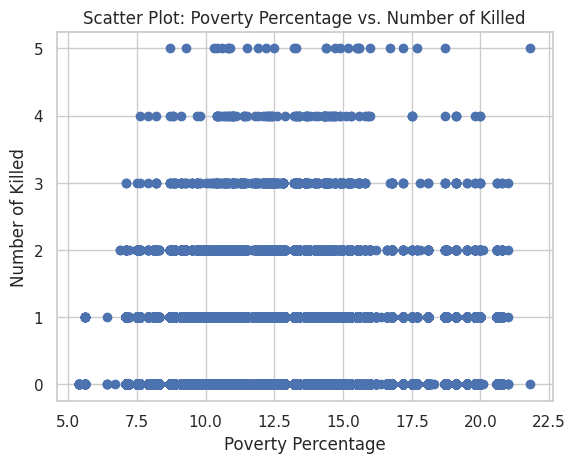

In [109]:
# Scatter Plot
plt.scatter(df_incidents_poverty['povertyPercentage'], df_incidents_poverty['n_killed'])
plt.xlabel('Poverty Percentage')
plt.ylabel('Number of Killed')
plt.title('Scatter Plot: Poverty Percentage vs. Number of Killed')
plt.show()

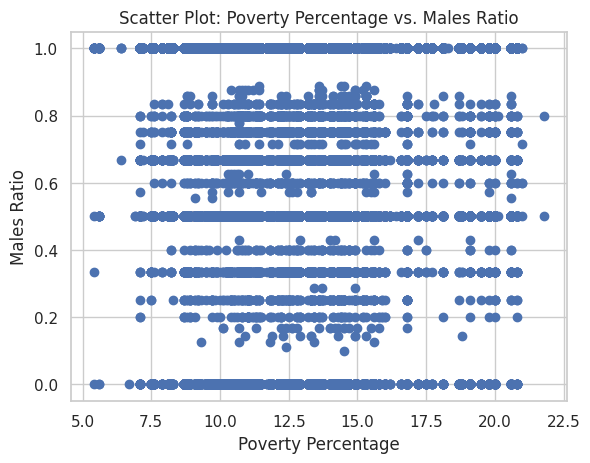

In [110]:
# Scatter Plot
plt.scatter(df_incidents_poverty['povertyPercentage'], df_incidents_poverty['males_ratio'])
plt.xlabel('Poverty Percentage')
plt.ylabel('Males Ratio')
plt.title('Scatter Plot: Poverty Percentage vs. Males Ratio')
plt.show()

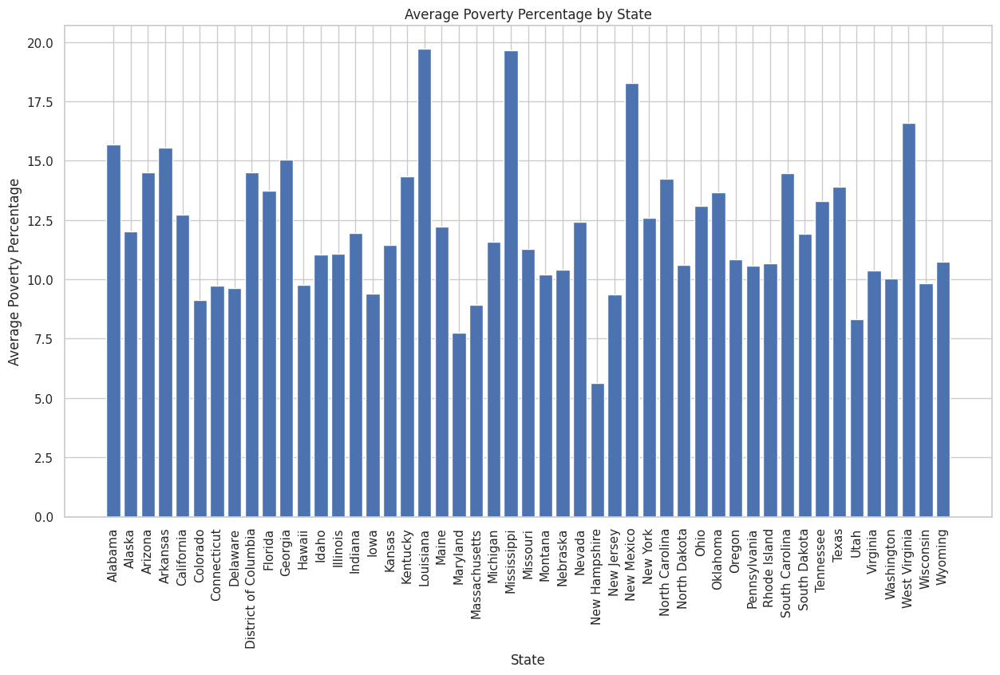

In [111]:
# Bar Plot
avg_poverty_by_state = df_incidents_poverty.groupby('state')['povertyPercentage'].mean().reset_index()
plt.bar(avg_poverty_by_state['state'], avg_poverty_by_state['povertyPercentage'])
plt.xlabel('State')
plt.ylabel('Average Poverty Percentage')
plt.title('Average Poverty Percentage by State')
plt.xticks(rotation=90)
#Size the plot to fit the labels
plt.gcf().set_size_inches(15, 8)
plt.show()

In [112]:
# Map Visualization
fig = px.scatter_mapbox(df_incidents_poverty,
                        lat="latitude",
                        lon="longitude",
                        hover_name="state",
                        color="povertyPercentage",
                        color_continuous_scale='Viridis',
                        size="n_participants",
                        zoom=3,
                        height=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

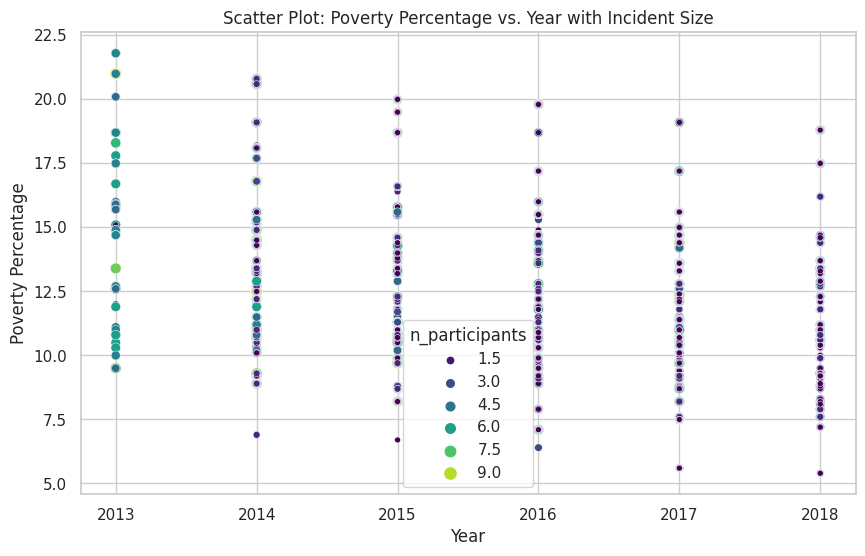

In [114]:
# Scatter Plot
fig, ax = plt.subplots(figsize=(10, 6))
sn.scatterplot(x='year', y='povertyPercentage', size='n_participants', hue='n_participants',
                palette='viridis', data=df_incidents_poverty, ax=ax)
ax.set_xlabel('Year')
ax.set_ylabel('Poverty Percentage')
ax.set_title('Scatter Plot: Poverty Percentage vs. Year with Incident Size')
plt.show()

In [115]:
# Interactive Scatter Plot using Plotly
fig = px.scatter(df_incidents_poverty, x='year', y='povertyPercentage', size='n_participants',
                 color='n_participants', hover_name='state', title='Interactive Scatter Plot: Poverty Percentage vs. Year with Incident Size')
fig.update_layout(xaxis_title='Year', yaxis_title='Poverty Percentage')
fig.show()

In [116]:
df_incidents_poverty.to_csv('data/df_incidents_poverty.csv', index=False)

# Ingest Year State District House Data Set

In [117]:
df_ysdh = pd.read_csv('data/year_state_district_house.csv')

In [118]:
df_ysdh.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10441 entries, 0 to 10440
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   year                    10441 non-null  int64 
 1   state                   10441 non-null  object
 2   congressional_district  10441 non-null  int64 
 3   party                   10441 non-null  object
 4   candidatevotes          10441 non-null  int64 
 5   totalvotes              10441 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 489.5+ KB


In [119]:
df_ysdh['state'].value_counts()

CALIFORNIA              1196
NEW YORK                 748
TEXAS                    735
FLORIDA                  543
PENNSYLVANIA             497
ILLINOIS                 484
OHIO                     454
MICHIGAN                 385
NEW JERSEY               317
NORTH CAROLINA           292
GEORGIA                  284
VIRGINIA                 256
MASSACHUSETTS            245
INDIANA                  232
TENNESSEE                213
MISSOURI                 213
WASHINGTON               211
WISCONSIN                205
MINNESOTA                192
MARYLAND                 192
LOUISIANA                170
ALABAMA                  168
ARIZONA                  161
COLORADO                 153
KENTUCKY                 152
SOUTH CAROLINA           150
CONNECTICUT              133
OKLAHOMA                 133
IOWA                     122
OREGON                   118
MISSISSIPPI              109
KANSAS                   104
ARKANSAS                  96
WEST VIRGINIA             79
UTAH          

In [121]:
# Identify columns with mixed types
mixed_type_cols = df_ysdh.applymap(type).nunique() > 1
mixed_cols = mixed_type_cols.index[mixed_type_cols].tolist()

print("Columns with mixed types:", mixed_cols)

# For each mixed-type column, identify the unique types
for col in mixed_cols:
    unique_types = df_ysdh[col].apply(type).unique()
    print(f"Unique types in column {col}: {unique_types}")

Columns with mixed types: []


#### Sytactics and Semantics on YSDH

In [122]:
condition = df_ysdh['candidatevotes'] < 1
print(f"Dataframe has {len(df_ysdh[condition])} entries for which 'candidatevotes < 1'.")
df_ysdh = df_ysdh[df_ysdh['candidatevotes'] >= 1]

Dataframe has 2 entries for which 'candidatevotes < 1'.


In [123]:
condition = df_ysdh['totalvotes'] < 1
print(f"Dataframe has {len(df_ysdh[condition])} entries for which 'totalvotes < 1'.")
df_ysdh = df_ysdh[df_ysdh['totalvotes'] >= 1]

Dataframe has 0 entries for which 'totalvotes < 1'.


In [124]:
df_ysdh.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10439 entries, 0 to 10440
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   year                    10439 non-null  int64 
 1   state                   10439 non-null  object
 2   congressional_district  10439 non-null  int64 
 3   party                   10439 non-null  object
 4   candidatevotes          10439 non-null  int64 
 5   totalvotes              10439 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 570.9+ KB


In [125]:
condition = df_ysdh['totalvotes'] < df_ysdh['candidatevotes']
print(f"Dataframe has {len(df_ysdh[condition])} entries for which 'totalvotes < candidatevotes'.")
df_ysdh = df_ysdh[df_ysdh['totalvotes'] >= df_ysdh['candidatevotes']]

Dataframe has 0 entries for which 'totalvotes < candidatevotes'.


In [126]:
df_ysdh.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10439 entries, 0 to 10440
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   year                    10439 non-null  int64 
 1   state                   10439 non-null  object
 2   congressional_district  10439 non-null  int64 
 3   party                   10439 non-null  object
 4   candidatevotes          10439 non-null  int64 
 5   totalvotes              10439 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 570.9+ KB


In [127]:
numerical_fields = ['candidatevotes', 'totalvotes']

In [128]:
def convert_states(x: str):
  return x.title() if x != 'DISTRICT OF COLUMBIA' else 'District of Columbia'

In [129]:
df_ysdh['state'] = df_ysdh['state'].apply(convert_states)

In [130]:
df_ysdh.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10439 entries, 0 to 10440
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   year                    10439 non-null  int64 
 1   state                   10439 non-null  object
 2   congressional_district  10439 non-null  int64 
 3   party                   10439 non-null  object
 4   candidatevotes          10439 non-null  int64 
 5   totalvotes              10439 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 570.9+ KB


In [131]:
df_ysdh['state'].value_counts()

California              1196
New York                 748
Texas                    735
Florida                  541
Pennsylvania             497
Illinois                 484
Ohio                     454
Michigan                 385
New Jersey               317
North Carolina           292
Georgia                  284
Virginia                 256
Massachusetts            245
Indiana                  232
Tennessee                213
Missouri                 213
Washington               211
Wisconsin                205
Minnesota                192
Maryland                 192
Louisiana                170
Alabama                  168
Arizona                  161
Colorado                 153
Kentucky                 152
South Carolina           150
Connecticut              133
Oklahoma                 133
Iowa                     122
Oregon                   118
Mississippi              109
Kansas                   104
Arkansas                  96
West Virginia             79
Utah          

In [132]:
df_ysdh['party'].value_counts()

DEMOCRAT                   5512
REPUBLICAN                 4856
DEMOCRATIC-FARMER-LABOR      58
INDEPENDENT                  10
INDEPENDENT-REPUBLICAN        2
FOGLIETTA (DEMOCRAT)          1
Name: party, dtype: int64

#### Visualizing YSDH

<Axes: xlabel='Total Votes', ylabel='Frequency'>

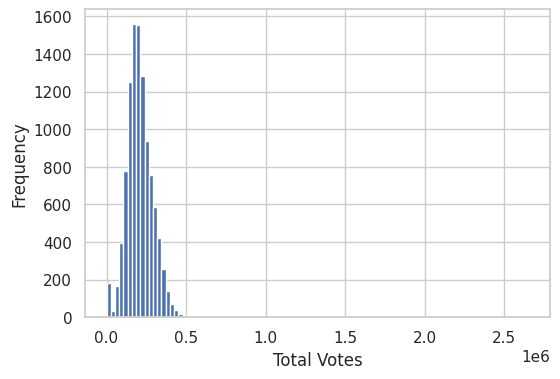

In [138]:
plt.figure(figsize=(6, 4))
plt.xlabel('Total Votes')
df_ysdh['totalvotes'].plot(kind='hist', bins=100)

In [143]:
len(df_ysdh[df_ysdh['totalvotes'] > 0.5e6])

6

In [146]:
df_ysdh = df_ysdh[df_ysdh['totalvotes'] < 0.5e6]

<Axes: xlabel='Total Votes', ylabel='Frequency'>

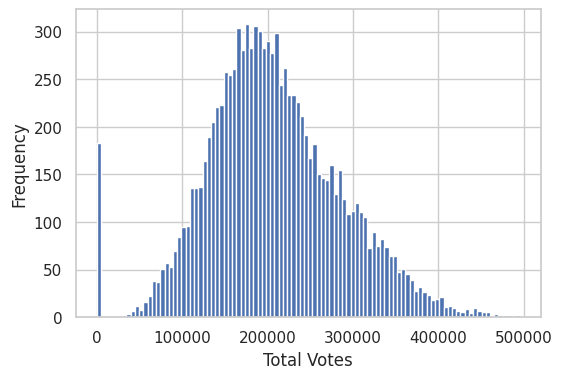

In [147]:
plt.figure(figsize=(6, 4))
plt.xlabel('Total Votes')
df_ysdh['totalvotes'].plot(kind='hist', bins=100)

In [154]:
df_ysdh[df_ysdh['totalvotes'] < 20_000].max(), len(df_ysdh[df_ysdh['totalvotes'] < 20_000])

(year                            2022
 state                       Oklahoma
 congressional_district            27
 party                     REPUBLICAN
 candidatevotes                     1
 totalvotes                         1
 dtype: object,
 183)

In [155]:
df_ysdh = df_ysdh[df_ysdh['totalvotes'] >= 20_000]

<Axes: xlabel='Total Votes', ylabel='Frequency'>

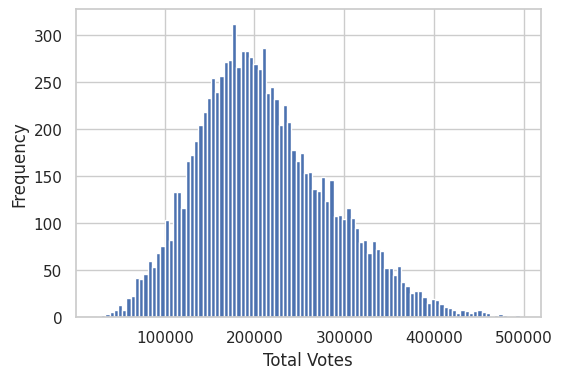

In [156]:
plt.figure(figsize=(6, 4))
plt.xlabel('Total Votes')
df_ysdh['totalvotes'].plot(kind='hist', bins=100)

<Axes: xlabel='Total Votes', ylabel='Frequency'>

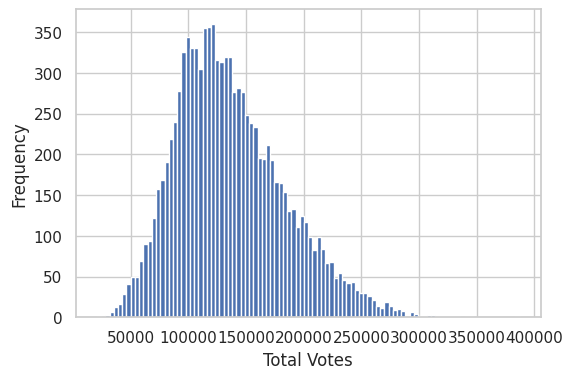

In [161]:
plt.figure(figsize=(6, 4))
plt.xlabel('Total Votes')
df_ysdh['candidatevotes'].plot(kind='hist', bins=100)

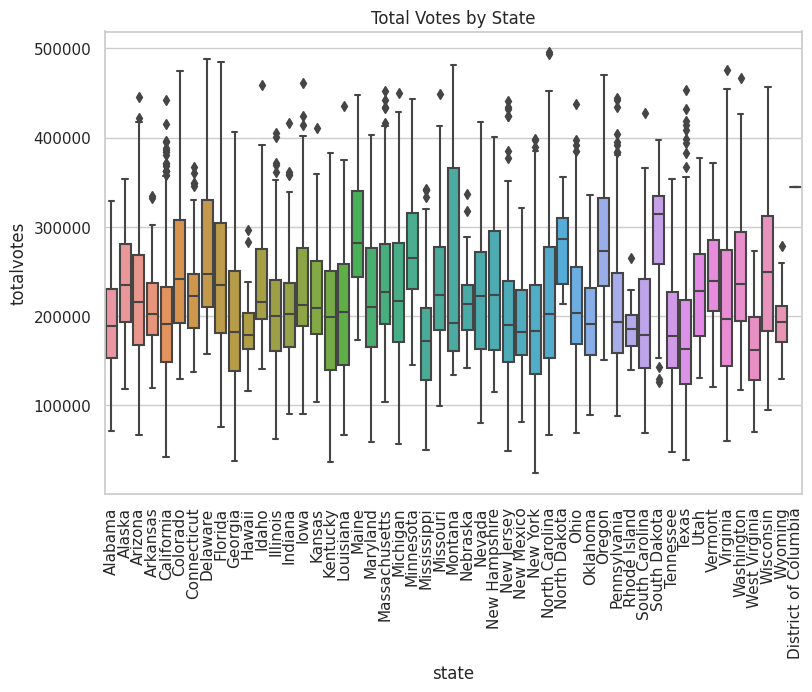

In [162]:
plt.figure(figsize=(9,6))
sn.boxplot(data=df_ysdh, x='state', y='totalvotes')
plt.xticks(rotation=90)
plt.title('Total Votes by State')
plt.show()

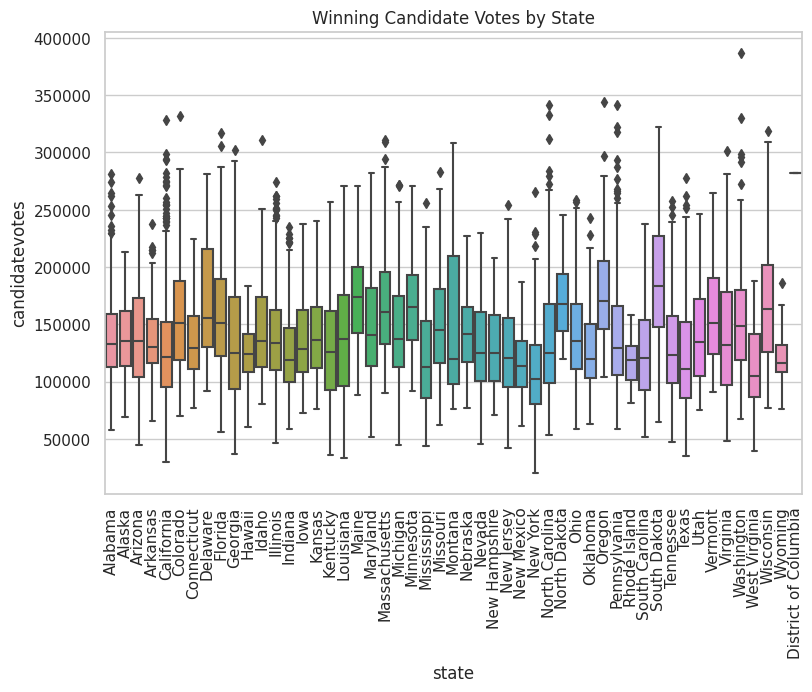

In [163]:
plt.figure(figsize=(9,6))
sn.boxplot(data=df_ysdh, x='state', y='candidatevotes')
plt.xticks(rotation=90)
plt.title('Winning Candidate Votes by State')
plt.show()

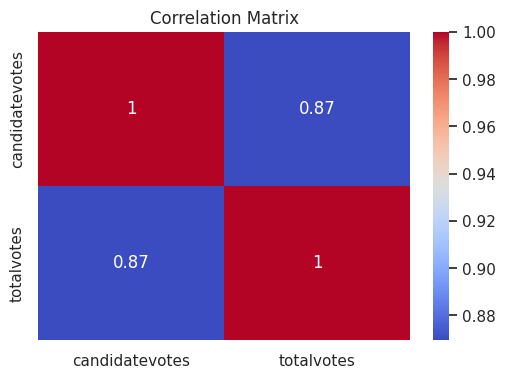

In [164]:
# 4. Discover new or confirm expected dependencies or correlations between attributes
correlation_matrix = df_ysdh[numerical_fields].corr()
plt.figure(figsize=(6,4))
sn.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

In [169]:
#Create composite key for state and district
df_ysdh['state_district'] = df_ysdh['state'].str.lower() + '_' + df_ysdh['congressional_district'].astype(str)

In [170]:
df_ysdh.head()

,year,state,congressional_district,party,candidatevotes,totalvotes,state_district
0,1976,Alabama,1,REPUBLICAN,98257,157170,alabama_1
1,1976,Alabama,2,REPUBLICAN,90069,156362,alabama_2
2,1976,Alabama,3,DEMOCRAT,106935,108048,alabama_3
3,1976,Alabama,4,DEMOCRAT,141490,176022,alabama_4
4,1976,Alabama,5,DEMOCRAT,113553,113560,alabama_5


In [171]:
df_ysdh.to_csv('data/data_understanding_year_state_district_house.csv', index=False)

**NOTE**: Done UP TO HERE!

# Merging the Three Data Sets

In [172]:
#Merge the poverty_incidents data with the year_state_district_house data for each row in the poverty_incidents data
df_incidents_poverty_house = pd.merge(df_incidents_poverty, df_ysdh, how='left', left_on=['state_congressional_district', 'year'], right_on=['state_district', 'year'])

In [173]:
#Print head of the merged dataframe
df_incidents_poverty_house.head()

,state_x,latitude,longitude,congressional_district_x,state_house_district,state_senate_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,...,month,day,weekday,povertyPercentage,state_y,congressional_district_y,party,candidatevotes,totalvotes,state_district
0,Indiana,39.8322,-86.2492,7,94,33,19,19,19,0.0,...,5,2,5,12.3,NaN,NaN,NaN,NaN,NaN,NaN
1,Michigan,42.4190,-83.0393,14,4,2,25,32,32,0.0,...,11,5,5,11.0,Michigan,14.0,DEMOCRAT,244135.0,310974.0,michigan_14
2,North Carolina,35.1847,-77.9527,13,4,7,65,65,65,0.0,...,1,18,5,15.3,NaN,NaN,NaN,NaN,NaN,NaN
3,Louisiana,30.6069,-91.2270,6,63,15,20,26,30,0.0,...,1,25,3,17.5,Louisiana,6.0,REPUBLICAN,186553.0,268525.0,louisiana_6
4,Virginia,38.3008,-77.4469,1,28,28,65,65,65,0.0,...,8,1,0,10.7,Virginia,1.0,REPUBLICAN,230213.0,384601.0,virginia_1


In [174]:
#Check basic information about the merged dataframe
df_incidents_poverty_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 125385 entries, 0 to 125384
Data columns (total 37 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   state_x                       125385 non-null  object        
 1   latitude                      125385 non-null  float64       
 2   longitude                     125385 non-null  float64       
 3   congressional_district_x      125385 non-null  int64         
 4   state_house_district          125385 non-null  int64         
 5   state_senate_district         125385 non-null  int64         
 6   min_age_participants          125385 non-null  int64         
 7   avg_age_participants          125385 non-null  int64         
 8   max_age_participants          125385 non-null  int64         
 9   n_participants_child          125385 non-null  float64       
 10  n_participants_teen           125385 non-null  float64       
 11  n_participant

In [ ]:
#Check for missing values
df_incidents_poverty_house.isnull().sum()

In [ ]:
#Check for percentage of missing values
df_incidents_poverty_house.isnull().sum()/len(df_incidents_poverty_house)

In [ ]:
#Vidualize the missing values
msno.matrix(df_incidents_poverty_house)
plt.figure(figsize = (15,9))
plt.show()

The year_state_disctrict house gives us voting results for every two years. Meaning that if we want to work with it we may need to discard about half of the incidents dataset which may not have election results

In [ ]:
#Take a backup of the merged dataframe just in case we need to revert back
df_incidents_poverty_house_backup = df_incidents_poverty_house.copy()

In [ ]:
#Drop the rows with missing values
df_incidents_poverty_house = df_incidents_poverty_house.dropna()

In [ ]:
#check for missing values
df_incidents_poverty_house.isnull().sum()

In [ ]:
#Export the cleaned data to a csv file
df_incidents_poverty_house.to_csv('data/df_incidents_poverty_house_data_understanding.csv')

## Visualizing The Final Merged Data